In [1]:
import numpy as np
import os
import pandas as pd
import itertools
from PIL import Image
import seaborn as sns
import fitsio
import skimage.io

# to make this notebook's output stable across runs
np.random.seed(7)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

%load_ext autoreload
%autoreload 2


In [2]:
REPO_DIR= os.path.join(os.environ['HOME'],
                       'myrepo/obiwan')
DATA_DIR= os.path.join(os.environ['HOME'],
                       'mydata')

In [3]:
from astrometry.util.fits import fits_table, merge_tables
from obiwan.common import fits2pandas

In [4]:
simcat=fits_table(os.path.join(DATA_DIR,
                 '1741p242','rs0/obiwan',
                 'simcat-elg-1741p242.fits'))
skipid=fits_table(os.path.join(DATA_DIR,
                 '1741p242','rs0/obiwan',
                 'skippedids-elg-1741p242.fits'))

obitractor= fits_table(os.path.join(DATA_DIR,
                 '1741p242','rs0/tractor',
                 'tractor-1741p242.fits'))

dr5tractor= fits_table(os.path.join(DATA_DIR,
                 '1741p242','dr5',
                 'tractor-1741p242.fits'))

In [5]:
len(simcat),len(skipid), simcat.get_columns()

(282,
 18,
 ['id',
  'seed',
  'ra',
  'dec',
  'x',
  'y',
  'gflux',
  'rflux',
  'zflux',
  'sersicn',
  'rhalf',
  'ba',
  'phi'])

## Visualize

### apply diff rotations to jpeg than fits to have image[xslice,yslice] correspond to simcat.x,y or tractor.bx,by

In [6]:
def readImage(fn,jpeg=False):
    """Reads FITS and jpeg images so that x,y indices refer to the same pixels
    regardless of image format. x,y and fits correspond so the jpeg is rotated and flipped 
    to align with fits
    
    Args:
        fn: image filename
        jpeg: bool, is is a jpeg?
    """
    if jpeg:
        img= skimage.io.imread(fn)
        for i in range(3):
            img[:,:,i]= np.rot90(img[:,:,i].T,1)
    else:
        img= fitsio.FITS(fn)[1].read()
    return img

def sliceImage(img,
               xslice=slice(None,None),yslice=slice(None,None)):
    """Not sure why, but simcat.x[xslice],simcat.y[yslice]
    corresponds to img[yslice,xslice], eg inverted for the image"""
    return img[yslice,xslice,...]

class plotImage(object):
    """Helper functions for displaying image and overlaying circles around sources
    
    Args:
        img: need to give as initial input b/c some helper funcs that dont directly
            use img, need its shape at least, see circles()
    """
    def imshow(self,img,ax,qs=[0.5,99.5]):
        if img.shape[-1] == 3:
            #minmax=np.percentile(np.sum(img,axis=2),q=qs)
            minmax=[None,None]
            cmap=None
        else:
            minmax=np.percentile(img,q=qs)
            cmap='gray'
        ax.imshow(img, interpolation='none', origin='lower',
                  cmap=cmap,vmin=minmax[0],vmax=minmax[1])
        ax.tick_params(direction='out')
        
    def circles(self,xs,ys,ax,
                img_shape=None,
                xslice=None,yslice=None,
                r_pixels=5./0.262,color='y'):
        """
        xs,ys: x,y positions of sources in pixels, e.g. tractor.bx or simcat.x
        img_shape: needed when xslice or yslice is None
        xlice,yslice: slice() objects into the image array
        r_pixels: radius circles in pixels
        """
        if (xslice is None) | (yslice is None):
            assert(not img_shape is None)
        if xslice is None:
            xslice= slice(0,img_shape[0])
        if yslice is None:
            yslice= slice(0,img_shape[1])
        keep= self.justInSlice(xs,ys,xslice,yslice)
        xpos,ypos= xs[keep]-xslice.start,ys[keep]-yslice.start
        
        from matplotlib.patches import Circle,Wedge
        from matplotlib.collections import PatchCollection
        dr= r_pixels/ 20 
        patches=[Wedge((x, y), r_pixels + dr, 0, 360,dr)
                 for x,y in zip(xpos, ypos) ]
        coll = PatchCollection(patches, color=color) #,alpha=1)
        ax.add_collection(coll)
        
    def justInSlice(self,x,y,xslice,yslice):
        """Returns bool array of x,y positions in the slice()"""
        return ((x >= xslice.start) & 
               (x <= xslice.stop) &
               (y >= yslice.start) & 
               (y <= yslice.stop))

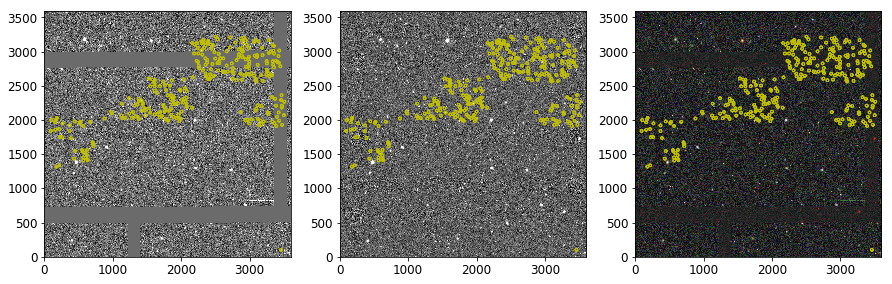

In [7]:
img_dr5_g= readImage(os.path.join(DATA_DIR,
                     '1741p242','dr5',
                     'legacysurvey-1741p242-image-g.fits.fz'))
img_dr5_r= readImage(os.path.join(DATA_DIR,
                     '1741p242','dr5',
                     'legacysurvey-1741p242-image-r.fits.fz'))
img_dr5_z= readImage(os.path.join(DATA_DIR,
                     '1741p242','dr5',
                     'legacysurvey-1741p242-image-z.fits.fz'))

img_obi_g= readImage(os.path.join(DATA_DIR,
                     '1741p242','rs0/coadd',
                     'legacysurvey-1741p242-image-g.fits.fz'))
img_obi_r= readImage(os.path.join(DATA_DIR,
                     '1741p242','rs0/coadd',
                     'legacysurvey-1741p242-image-r.fits.fz'))
img_obi_z= readImage(os.path.join(DATA_DIR,
                     '1741p242','rs0/coadd',
                     'legacysurvey-1741p242-image-z.fits.fz'))

img_jpg= readImage(os.path.join(DATA_DIR,
                      '1741p242','rs0/coadd',
                      'legacysurvey-1741p242-image.jpg'),
                     jpeg=True)

fig,ax= plt.subplots(1,3,figsize=(15,5))
plotImage().imshow(img_obi_r,ax[0])
plotImage().imshow(img_obi_z,ax[1])
plotImage().imshow(img_jpg,ax[2])
for i in range(3):
    plotImage().circles(simcat.x,simcat.y,ax[i],
                        img_shape=img_obi_z.shape)

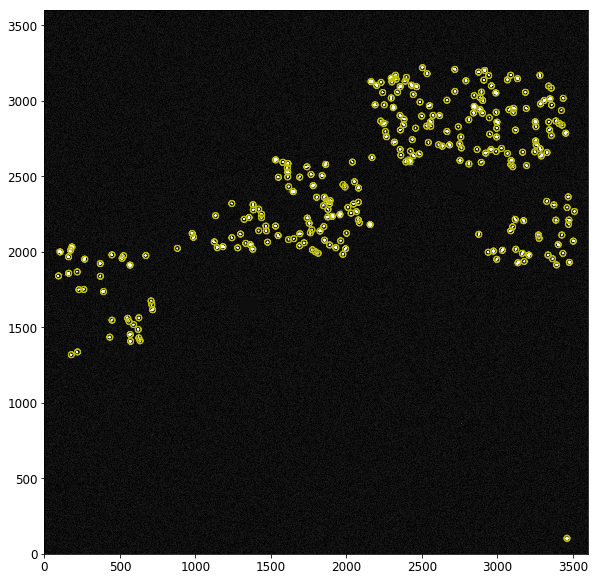

In [8]:
fig,ax= plt.subplots(figsize=(10,10))
plotImage().imshow(img_obi_z - img_dr5_z,ax)
plotImage().circles(simcat.x,simcat.y,ax,
                    img_shape=img_obi_z.shape)

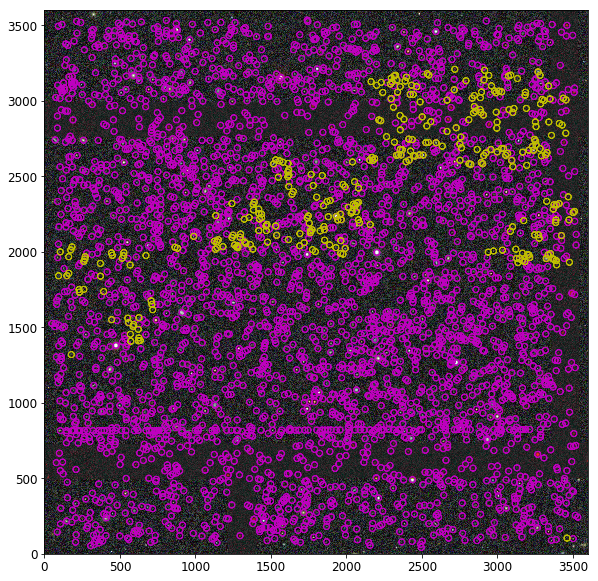

In [9]:
fig,ax= plt.subplots(figsize=(10,10))
plotImage().imshow(img_jpg,ax)
plotImage().circles(dr5tractor.bx,dr5tractor.by,ax,
                    img_shape=img_jpg[:,:,0].shape,
                    color='m')
plotImage().circles(obitractor.bx,obitractor.by,ax,
                    img_shape=img_jpg[:,:,0].shape,
                    color='y')

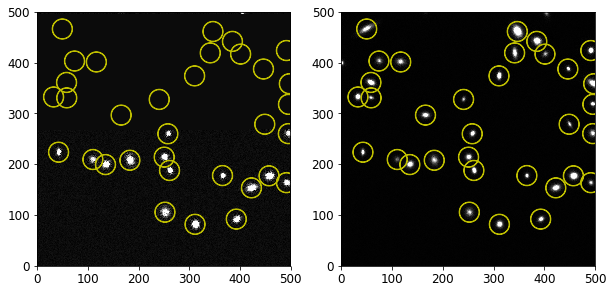

In [10]:
xslc,yslc= slice(2500,3000), slice(2500,3000)

fig,ax= plt.subplots(1,2,figsize=(10,5))
plotImage().imshow(sliceImage(img_obi_r - img_dr5_r,xslc,yslc),ax[0])
plotImage().imshow(sliceImage(img_obi_z - img_dr5_z,xslc,yslc),ax[1])
for i in range(2):
    plotImage().circles(simcat.x,simcat.y,ax[i],
                        xslice=xslc,yslice=yslc)

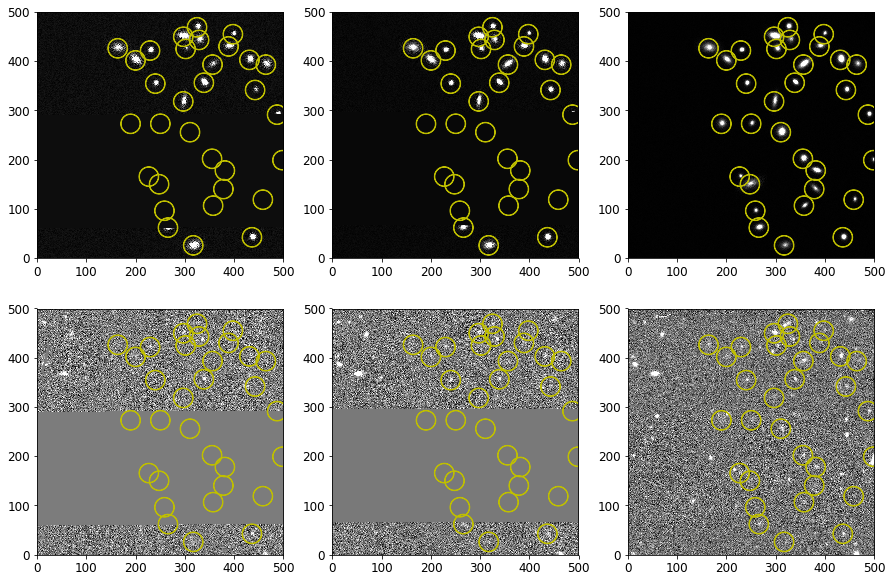

In [11]:
xslc,yslc= slice(2000,2500), slice(2700,3200)

fig,ax= plt.subplots(2,3,figsize=(15,10))
plotImage().imshow(sliceImage(img_obi_g - img_dr5_g,xslc,yslc),ax[0,0])
plotImage().imshow(sliceImage(img_obi_r - img_dr5_r,xslc,yslc),ax[0,1])
plotImage().imshow(sliceImage(img_obi_z - img_dr5_z,xslc,yslc),ax[0,2])
plotImage().imshow(sliceImage(img_obi_g,xslc,yslc),ax[1,0])
plotImage().imshow(sliceImage(img_obi_r,xslc,yslc),ax[1,1])
plotImage().imshow(sliceImage(img_obi_z,xslc,yslc),ax[1,2])
for i in range(3):
    plotImage().circles(simcat.x,simcat.y,ax[0,i],
                        xslice=xslc,yslice=yslc)
    plotImage().circles(simcat.x,simcat.y,ax[1,i],
                        xslice=xslc,yslice=yslc)

## Recovered, Missing, Real

(-0.01, 0.01)

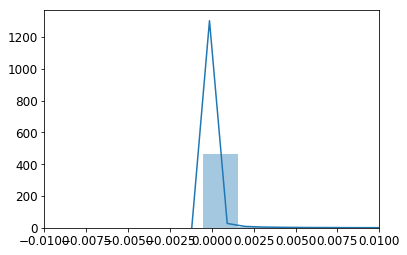

In [12]:
import seaborn as sns
sns.distplot(sliceImage(img_obi_z-img_dr5_z,xslc,yslc).flatten()) #,s=np.linspace(-0.01,0.01,num=100))
plt.xlim(-0.01,0.01)

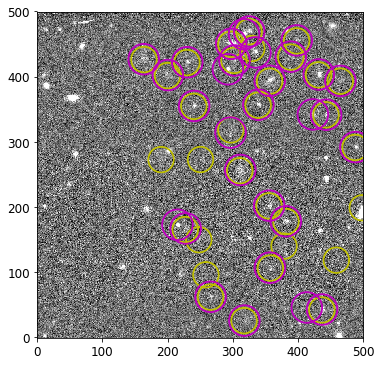

In [13]:
xslc,yslc= slice(2000,2500), slice(2700,3200)

fix,ax=plt.subplots(figsize=(12,6))
plotImage().imshow(sliceImage(img_obi_z,xslc,yslc),ax)
# NOTE: x pixel - y slice start IS correct
plotImage().circles(simcat.x,simcat.y,ax,
                    xslice=xslc,yslice=yslc,color='y',r_pixels=5/0.262)
plotImage().circles(obitractor.bx,obitractor.by,ax,
                    xslice=xslc,yslice=yslc,color='m',r_pixels=6/0.262)

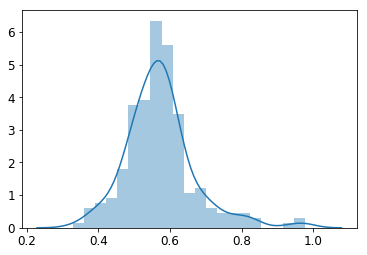

In [14]:
def not_index(indices,n):
    keep=np.ones(n,bool)
    keep[indices]=False
    return np.arange(n)[keep]

from astrometry.libkd.spherematch import match_radec
isim,itrac,d= match_radec(simcat.ra, simcat.dec, obitractor.ra, obitractor.dec,          
                          1./3600.0,nearest=True)
not_isim= not_index(isim,len(simcat))
not_itrac= not_index(itrac,len(obitractor))
sns.distplot(d*3600)

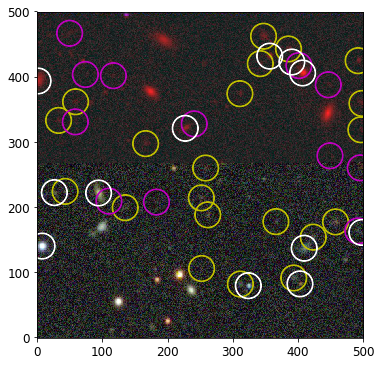

In [15]:
xslc,yslc= slice(2500,3000), slice(2500,3000)

fix,ax=plt.subplots(figsize=(12,6))
plotImage().imshow(sliceImage(img_jpg,xslc,yslc),ax)
# Recovered
plotImage().circles(obitractor.bx[itrac],obitractor.by[itrac],ax,
        xslice=xslc,yslice=yslc,
        color='y',r_pixels=5/0.262)
# Missed 
plotImage().circles(simcat.x[not_isim],simcat.y[not_isim],ax,
        xslice=xslc,yslice=yslc,
        color='m',r_pixels=5/0.262)
# Real
plotImage().circles(obitractor.bx[not_itrac],obitractor.by[not_itrac],ax,
        xslice=xslc,yslice=yslc,
        color='w',r_pixels=5/0.262)

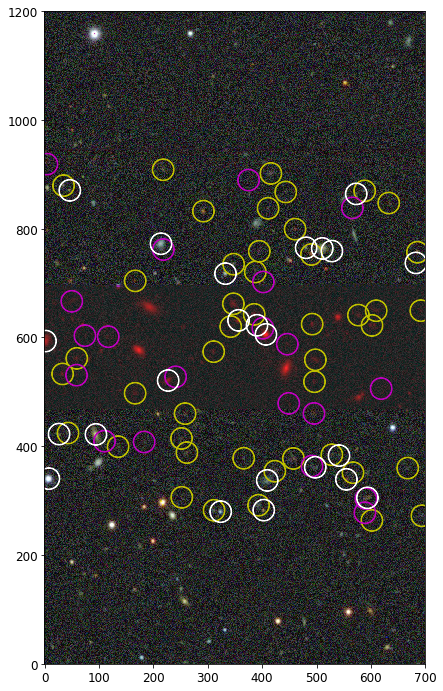

In [16]:
xslc,yslc= slice(2500,3200),slice(2300,3500)

fix,ax=plt.subplots(figsize=(8,12))
plotImage().imshow(sliceImage(img_jpg,xslc,yslc),ax)
# Recovered
plotImage().circles(obitractor.bx[itrac],obitractor.by[itrac],ax,
        xslice=xslc,yslice=yslc,
        color='y',r_pixels=5/0.262)
# Missed 
plotImage().circles(simcat.x[not_isim],simcat.y[not_isim],ax,
        xslice=xslc,yslice=yslc,
        color='m',r_pixels=5/0.262)
# Real
plotImage().circles(obitractor.bx[not_itrac],obitractor.by[not_itrac],ax,
        xslice=xslc,yslice=yslc,
        color='w',r_pixels=5/0.262)


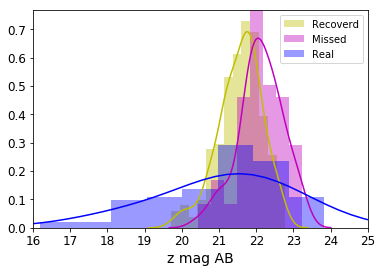

In [17]:
class Flux2mag(object):
    """convert simcat or tractor fluxes, NaN where flux <= 0
    
    Note: both fluxes have units of nanomaggies, however simcat fluxes
    are corrected while tractor fluxes do not correct for 
    extinction
    """ 
    def __init__(self):
        print('WARNING:Neither simcat or tractor fluxes are extinction corrected')
            
    def simcat(self,flux):
        mag= np.zeros(len(flux))-1
        keep= flux > 0
        mag[keep]= -2.5*np.log10(1e-9 * flux[keep])
        return np.ma.masked_array(mag,
                                  mask= flux <= 0)
    
    def tractor(self,flux,mw_ext):
        raw_mag= self.simcat(flux)
        return raw_mag #- mw_ext[keep]

F= Flux2mag()
sns.distplot(F.simcat(simcat.zflux[isim]),color='y',label='Recoverd')
sns.distplot(F.simcat(simcat.zflux[not_isim]),color='m',label='Missed')
sns.distplot(F.tractor(obitractor.flux_z[not_itrac],
                       obitractor.mw_transmission_z[not_itrac]),
             color='b',label='Real')
plt.xlabel('z mag AB')
plt.xlim(16,25)
plt.legend()

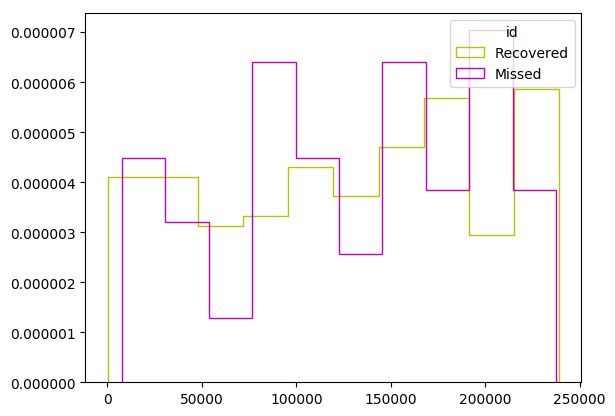

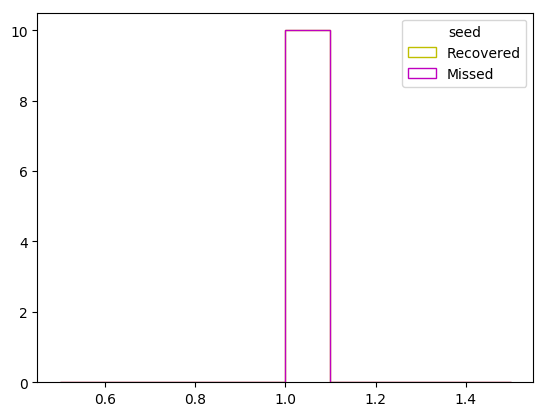

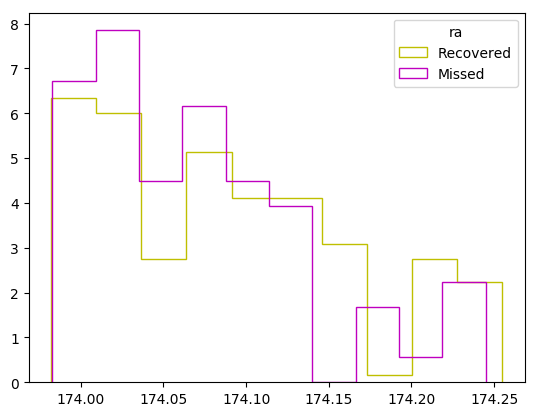

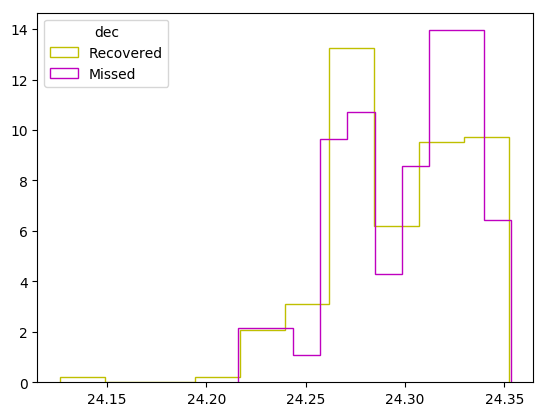

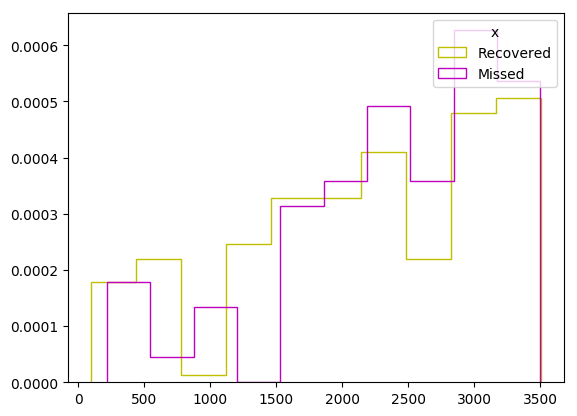

...

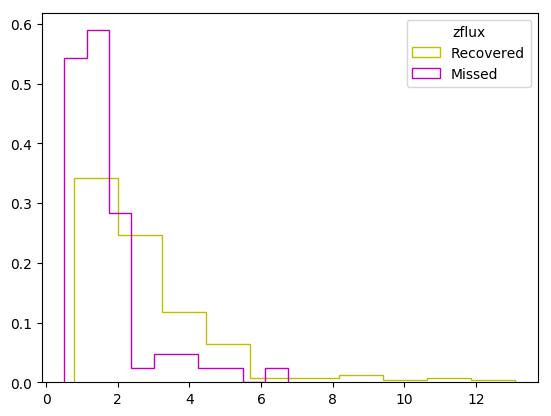

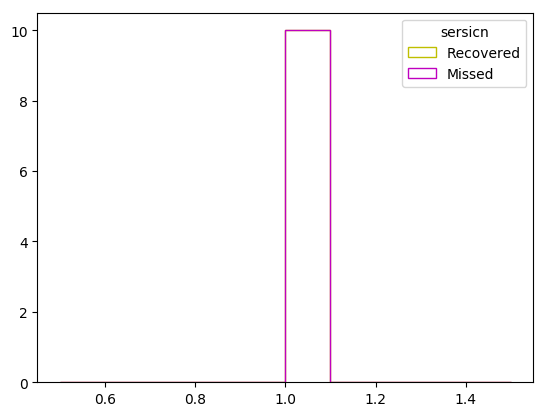

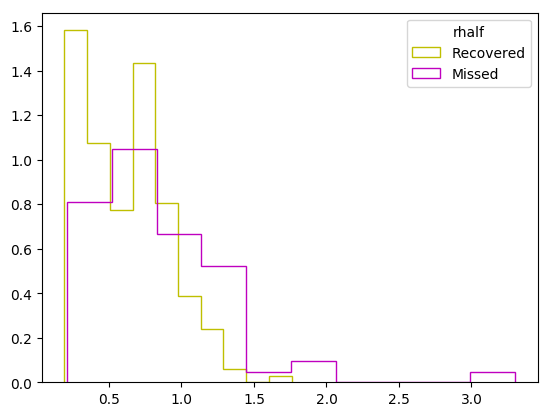

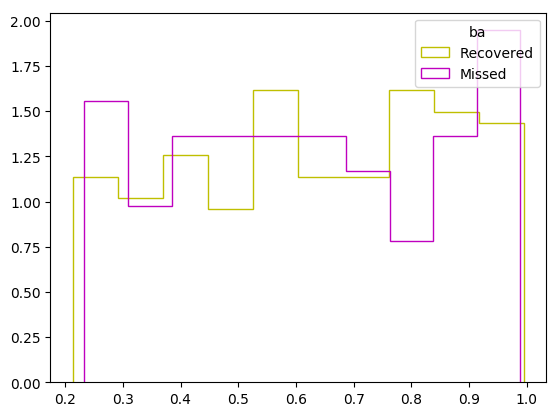

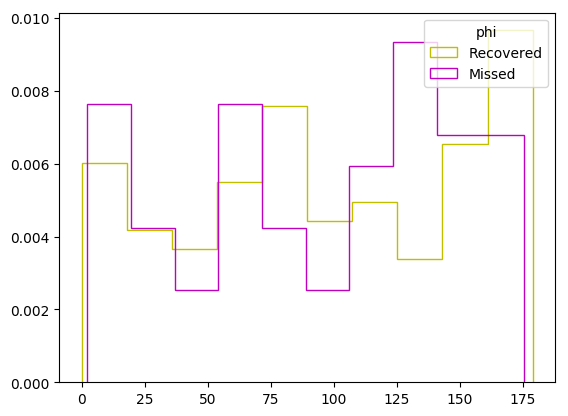

In [18]:
def myhist(x,c='b',lab='',normed=True):
    sns.reset_orig()
    _= plt.hist(x,histtype='step',normed=normed,
                color=c,label=lab)

for var in simcat.get_columns():
    for indices,lab,c in zip([isim,not_isim],['Recovered','Missed'],['y','m']):
        myhist(simcat.get(var)[indices],c=c,lab=lab)
    plt.legend(title=var)
    plt.show()

## Bin by magnitude

In [19]:
def get_q25(x):
    return np.percentile(x,q=25)

def get_q50(x):
    return np.percentile(x,q=50)

def get_q75(x):
    return np.percentile(x,q=75)


new= pd.DataFrame({
    'trac_mag':F.tractor(obitractor.flux_z[itrac],
                         obitractor.mw_transmission_z[itrac]),
    'sim_mag':F.simcat(simcat.zflux[isim])
    })
new['diff']= new['sim_mag'] - new['trac_mag']
#W=0.2
#LO,HI=new['sim_mag'].min()-W,new['sim_mag'].max()
#new['bins']= pd.cut(new['sim_mag'],bins=np.arange(LO,HI+W*2,W))
new['bins']= pd.cut(new['sim_mag'],bins=15)
a= new.groupby('bins').agg([get_q25,get_q50,get_q75])
a.head()
#new['bins'].cat.categories.mid

sim_mag                         trac_mag             \
                    get_q25    get_q50    get_q75    get_q25    get_q50   
bins                                                                      
(19.704, 19.913]  19.758501  19.809545  19.860590  19.713614  19.779356   
(19.913, 20.118]  19.953417  19.982250  20.028189  19.948938  19.950054   
(20.118, 20.323]  20.146553  20.161123  20.207467  20.278008  20.286423   
(20.323, 20.528]  20.394506  20.421235  20.424951  20.376431  20.451448   
(20.528, 20.733]  20.630314  20.653788  20.670790  20.600925  20.657610   

                                 diff                      
                    get_q75   get_q25   get_q50   get_q75  
bins                                                       
(19.704, 19.913]  19.845098  0.015492  0.030189  0.044887  
(19.913, 20.118]  20.037999 -0.037527 -0.023239  0.004479  
(20.118, 20.323]  20.315403 -0.160436 -0.137611 -0.085111  
(20.323, 20.528]  20.493268 -0.068317 -0.030213  0.018075  
(20.528, 20.733]  20.695587 -0.016108  0.001160  0.021018

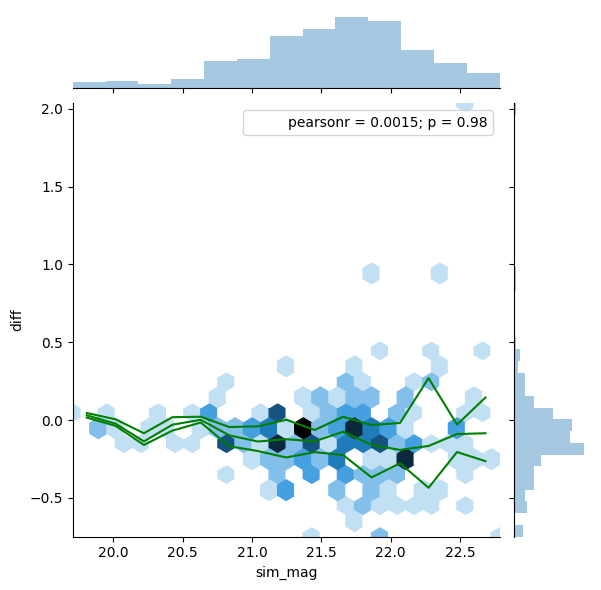

In [20]:
g = sns.jointplot(x="sim_mag", y="diff", data=new,
                  kind='hex')
binc= a.index.categories.mid
g.ax_joint.plot(binc,a['diff']['get_q25'],'g-')
g.ax_joint.plot(binc,a['diff']['get_q50'],'g-')
g.ax_joint.plot(binc,a['diff']['get_q75'],'g-')

## Quality cuts for tractor measurements

In [21]:
print(set(np.char.strip(obitractor.get('type'))))
len(obitractor[obitractor.allmask_z != 0]),len(obitractor[obitractor.anymask_z != 0])

set(['COMP', 'REX', 'PSF', 'EXP', 'DEV'])


(1, 16)

In [22]:
objtypes= ['psf','rex','exp','dev','comp']

def get_tractor_cuts(tractor):
    cuts= {} #{'photometric':np.ones(len(tractor),bool)}
    for b in ['g','r','z']:
        cuts['phot_'+b]= ((tractor.get('flux_'+b) > 0) &
                          (tractor.get('flux_ivar_'+b) > 0) &
                          (tractor.get('allmask_'+b) == 0))
    for col in objtypes:
        cuts[col]= np.char.strip(tractor.get('type')) == col.upper()
    return cuts

cuts_obitractor= get_tractor_cuts(obitractor)

### Do mag histograms depend on isPhotometric?

('Photometric', ' 214')
('Not', ' 0')


/home/kaylan/env_galsim/local/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6201: RuntimeWarning: invalid value encountered in true_divide
  m = (m.astype(float) / db) / m.sum()


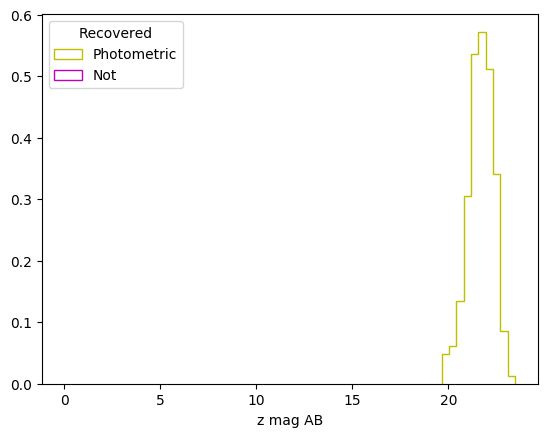

('Photometric', ' 104')
('Not', ' 3')


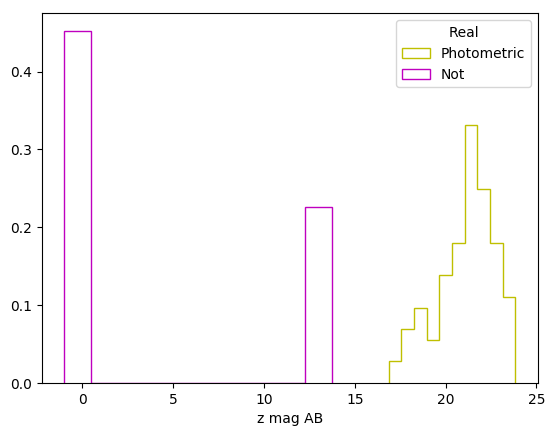

In [23]:
def indices2bool(indices,n):
    keep= np.zeros(n,bool)
    keep[indices]=True
    return keep

#Recovered
btrac= indices2bool(itrac,len(obitractor))
for bcut,lab,c in zip([cuts_obitractor['phot_z'],
                       cuts_obitractor['phot_z'] == False],
                       ['Photometric','Not'],['y','m']):
    print(lab,' %d' % len(obitractor[(btrac) & (bcut)]))
    myhist(F.tractor(obitractor.flux_z[(btrac) & (bcut)],
                     obitractor.mw_transmission_z[(btrac) & (bcut)]),
                     c=c,lab=lab)
plt.legend(title='Recovered')
plt.xlabel('z mag AB')
plt.show()

#Real
btrac= indices2bool(not_itrac,len(obitractor))
for bcut,lab,c in zip([cuts_obitractor['phot_z'],
                       cuts_obitractor['phot_z'] == False],
                       ['Photometric','Not'],['y','m']):
    print(lab,' %d' % len(obitractor[(btrac) & (bcut)]))
    myhist(F.tractor(obitractor.flux_z[(btrac) & (bcut)],
                     obitractor.mw_transmission_z[(btrac) & (bcut)]),
                     c=c,lab=lab)
plt.legend(title='Real')
plt.xlabel('z mag AB')
plt.show()
#plt.xlim(16,25)



### What fraction of Recovered sources are photometric? 

~ 100%

In [24]:
recovered= pd.DataFrame({
    'sim_mag':F.simcat(simcat.zflux[isim]),
    'isPhotZ':cuts_obitractor['phot_z'][isim]
})
recovered['bins']= pd.cut(recovered['sim_mag'],bins=15)
recovered.head()

,isPhotZ,sim_mag,bins
0,True,21.451953,"(21.349, 21.554]"
1,True,22.592270,"(22.58, 22.785]"
2,True,21.624738,"(21.554, 21.759]"
3,True,21.212229,"(21.144, 21.349]"
4,True,21.583440,"(21.554, 21.759]"


                   isPhotZ    sim_mag
bins                                 
(21.759, 21.964]  1.000000  21.861761
(21.964, 22.17]   1.000000  22.074437
(22.17, 22.375]   1.000000  22.263788
(22.375, 22.58]   1.000000  22.497383
(22.58, 22.785]   0.833333  22.678082


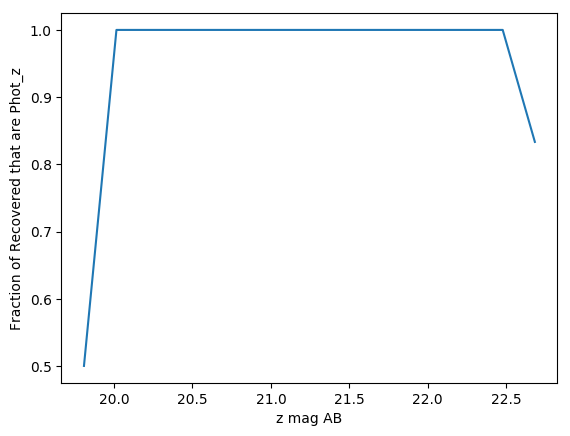

In [25]:
result= recovered.groupby('bins').sum() / recovered.groupby('bins').count()
print(result.tail(5))

plt.plot(result.index.categories.mid,result['isPhotZ'])
#plt.axvline(result.index[result['isPhotz'] <= 0.5][0],c='r',ls='-')
plt.xlabel('z mag AB')
plt.ylabel('Fraction of Recovered that are Phot_z')

### on object type? 

### YES
All injected galaxies have n=1 hardcoded, and doing something more complicated doesn't look like it matters becuase the fainted Recovered sources are PSF, then slightly brighter REX, then brighter EXP

('psf', ' 11')
('rex', ' 169')
('exp', ' 32')
('dev', ' 2')
('comp', ' 0')


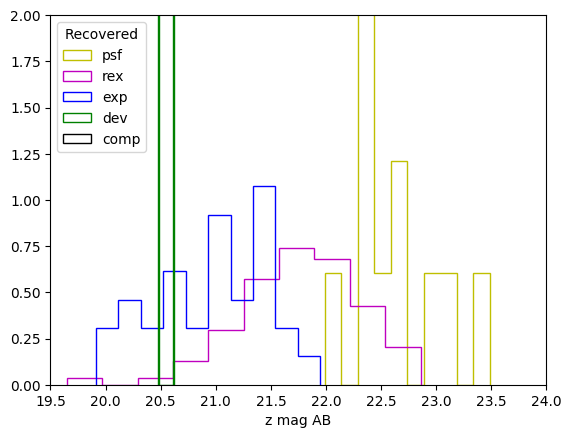

('psf', ' 25')
('rex', ' 44')
('exp', ' 26')
('dev', ' 10')
('comp', ' 2')


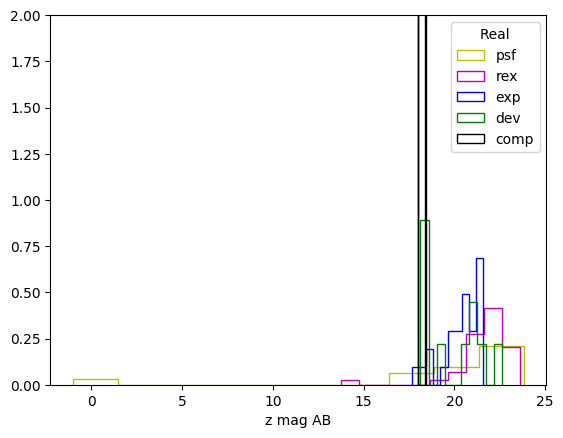

In [26]:
#Recovered 
btrac= indices2bool(itrac,len(obitractor))
for objtype,c in zip(objtypes,['y','m','b','g','k','gray']):
    isObj= (cuts_obitractor[objtype]) & (btrac)
    print(objtype,' %d' % len(obitractor[isObj]))
    myhist(F.tractor(obitractor.flux_z[isObj],
                     obitractor.mw_transmission_z[isObj]),
                     c=c,lab=objtype,normed=True)
plt.legend(title='Recovered')
plt.xlabel('z mag AB')
plt.ylim(0,2)
plt.xlim(19.5,24)
plt.show()

#Real
btrac= indices2bool(not_itrac,len(obitractor))
for objtype,c in zip(objtypes,['y','m','b','g','k','gray']):
    isObj= (cuts_obitractor[objtype]) & (btrac)
    print(objtype,' %d' % len(obitractor[isObj]))
    myhist(F.tractor(obitractor.flux_z[isObj],
                     obitractor.mw_transmission_z[isObj]),
                     c=c,lab=objtype,normed=True)
plt.legend(title='Real')
plt.xlabel('z mag AB')
plt.ylim(0,2)
plt.show()

### What fraction of injected galaxies are recovered as func of mag? 

In [27]:
fraction= pd.DataFrame({
    'sim_mag':F.simcat(simcat.zflux),
    'isRecovered':indices2bool(isim,len(simcat))
})
fraction['bins']= pd.cut(fraction['sim_mag'],bins=15)
# W=0.2
# LO,HI=fraction['sim_mag'].min()-W,fraction['sim_mag'].max()
# fraction['binc']= np.zeros(len(fraction))
# for low,hi in zip(np.arange(LO,HI+W,W),np.arange(LO+W,HI+W*2,W)):
#     fraction.loc[((fraction['sim_mag'] > low) &
#                    (fraction['sim_mag'] <= hi)), 'binc']= (low+hi)/2
fraction.head()

,isRecovered,sim_mag,bins
0,True,21.451953,"(21.354, 21.59]"
1,True,22.592270,"(22.531, 22.766]"
2,True,21.624738,"(21.59, 21.825]"
3,False,22.330312,"(22.296, 22.531]"
4,False,20.427215,"(20.413, 20.649]"


In [28]:
result= fraction.groupby('bins').sum() / fraction.groupby('bins').count()
result.head(10)

,isRecovered,sim_mag
bins,,
"(19.704, 19.943]",1.000000,19.847891
"(19.943, 20.178]",1.000000,20.087371
"(20.178, 20.413]",1.000000,20.310795
"(20.413, 20.649]",0.833333,20.526575
"(20.649, 20.884]",0.875000,20.778800
"(20.884, 21.119]",0.823529,21.037349
"(21.119, 21.354]",0.965517,21.218799
"(21.354, 21.59]",0.967742,21.465643
"(21.59, 21.825]",0.775510,21.709568


In [29]:
result.index[result['isRecovered'] <= 0.5][0]

Interval(22.530999999999999, 22.765999999999998, closed='right')

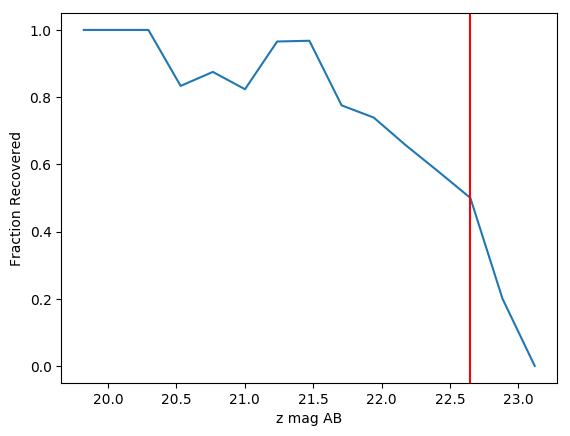

In [30]:
plt.plot(result.index.categories.mid,result['isRecovered'])
plt.axvline(result.index.categories.mid[result['isRecovered'] <= 0.5][0],c='r',ls='-')
plt.xlabel('z mag AB')
plt.ylabel('Fraction Recovered')

### Can I redo the above but one curve for each objtype?

No, can only do it for Recovered sources

### What fraction of all objects recovered is each objtype? ...basically answered that above

In [31]:
frac_recovered= fraction.iloc[isim]
for objtype in objtypes:
    frac_recovered['is'+objtype]= cuts_obitractor[objtype][itrac]
frac_recovered.head()


/home/kaylan/env_galsim/lib/python2.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,isRecovered,sim_mag,bins,ispsf,isrex,isexp,isdev,iscomp
0,True,21.451953,"(21.354, 21.59]",False,True,False,False,False
1,True,22.592270,"(22.531, 22.766]",False,True,False,False,False
2,True,21.624738,"(21.59, 21.825]",False,True,False,False,False
5,True,21.212229,"(21.119, 21.354]",False,True,False,False,False
6,True,21.583440,"(21.354, 21.59]",False,True,False,False,False


In [32]:
result= frac_recovered.groupby('bins').sum() / frac_recovered.groupby('bins').count()
result.head()

,isRecovered,sim_mag,ispsf,isrex,isexp,isdev,iscomp
bins,,,,,,,
"(19.704, 19.943]",1.0,19.847891,0.0,0.666667,0.333333,0.000000,0.0
"(19.943, 20.178]",1.0,20.087371,0.0,0.000000,1.000000,0.000000,0.0
"(20.178, 20.413]",1.0,20.310795,0.0,0.500000,0.500000,0.000000,0.0
"(20.413, 20.649]",1.0,20.546447,0.0,0.400000,0.600000,0.000000,0.0
"(20.649, 20.884]",1.0,20.773034,0.0,0.642857,0.285714,0.071429,0.0


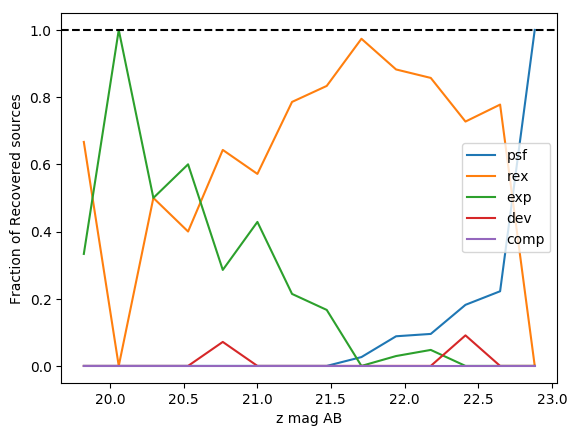

In [33]:
for objtype,c in zip(objtypes,['y','m','b','g','cyan']):
    plt.plot(result.index.categories.mid,result['is'+objtype],label=objtype)
plt.axhline(1,c='k',ls='--')
plt.legend()
#plt.axvline(result.index[result['isRecovered'] <= 0.5][0],c='r',ls='-')
plt.xlabel('z mag AB')
plt.ylabel('Fraction of Recovered sources')

## What do recovered and missed sources look like?

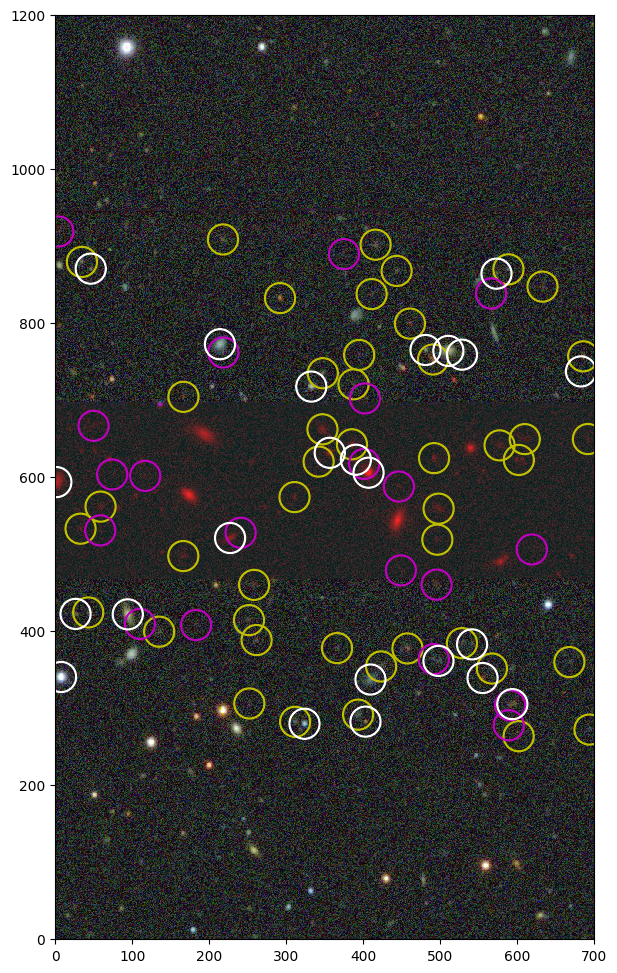

In [34]:
xslc,yslc= slice(2500,3200),slice(2300,3500) 
fig,ax=plt.subplots(figsize=(8,12))

plotImage().imshow(sliceImage(img_jpg,xslc,yslc),ax)
# Recovered
plotImage().circles(obitractor.bx[itrac],obitractor.by[itrac],ax,
                    xslice=xslc,yslice=yslc,
                    color='y',r_pixels=5/0.262)
# Missed 
plotImage().circles(simcat.x[not_isim],simcat.y[not_isim],ax,
                    xslice=xslc,yslice=yslc,
                    color='m',r_pixels=5/0.262)
# Real
plotImage().circles(obitractor.bx[not_itrac],obitractor.by[not_itrac],ax,
                    xslice=xslc,yslice=yslc,
                    color='w',r_pixels=5/0.262)


In [35]:
class Panel(object):
    """Plots panel of N cutouts for N sources from an image and any slice into it
    
    TODO: normalize each cutout before adding it to the panel
    
    Args:
        img: full image
        x_all,y_all: positions of all sources in the full image
        jpeg: bool, rotate fits image and jpeg image differently when display
        xslc,yslc: slice() objects if want to take subset of full image and sources
        hw: half-width [pixels]                                                                                                                          
        nrows: number of rows and also number of cols
        
    Returns:
        panel:
        panel
    """         
    def __init__(self,img,x_all,y_all,
                 xslc=None,yslc=None,
                 nrows=2,hw=30):  
        assert((len(x_all) > 0 ) & (len(y_all) > 0))
        dims = (nrows*hw*2,nrows*hw*2)
        if len(img.shape) == 3:
            dims = tuple(list(dims)+[3])
        self.panel= np.zeros(dims).astype(img.dtype)
        
        self.xpan= np.arange(0, dims[0], hw*2, dtype=int)
        self.ypan = np.arange(0, dims[1], hw*2, dtype=int)
        
        if xslc is None:
            xslc=slice(0,img.shape[0])
        if yslc is None:
            yslc=slice(0,img.shape[1])
        if len(dims) == 3:
            pil_img= Image.fromarray(sliceImage(img_jpg,xslc,yslc),mode='RGB')
        else:
            pil_img= Image.fromarray(sliceImage(img,xslc,yslc))
        keep= plotImage().justInSlice(x_all,y_all,xslc,yslc)
        x_inslice,y_inslice= x_all[keep],y_all[keep]
        print(len(x_inslice),nrows**2)
        npanels= min(nrows**2,len(x_inslice))
        i=0
        self.x,self.y=[],[]
        for xp,yp in itertools.product(self.xpan,self.ypan):
                xs,ys=x_inslice[i]-xslc.start,y_inslice[i]-yslc.start
                cutout= pil_img.crop((xs-hw,ys-hw,xs+hw,ys+hw))
                self.panel[xp:xp+2*hw, yp:yp+2*hw]= cutout
                # retain exact position
                self.x.append(xp+ hw + xs-int(xs))
                self.y.append(yp+ hw + ys-int(ys))
                i+=1
                if i >= npanels:
                    break
        self.x,self.y= np.array(self.x),np.array(self.y)
    
    def plot(self,ax,title=None):
        plotImage().imshow(self.panel,ax)
        plotImage().circles(self.x,self.y,ax,
                            img_shape=self.panel.shape,
                            color='y',r_pixels=5/0.262)
        # borders
        for xp,yp in zip(self.xpan[1:],self.ypan[1:]):
            ax.axvline(xp,c='y')
            ax.axhline(yp,c='y')
        if title:
            ax.set_title(title)
            

(107, 100)


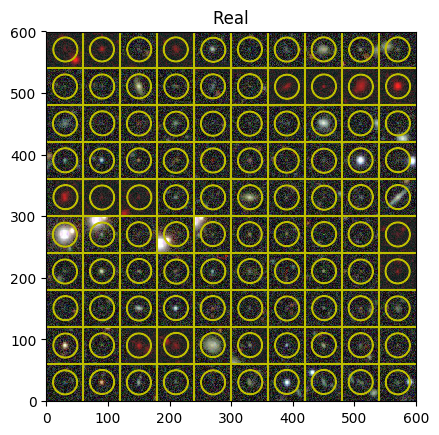

In [39]:
xslc,yslc= None,None #slice(2500,3200),slice(2300,3500) 
p= Panel(img_jpg,obitractor.bx[not_itrac],obitractor.by[not_itrac],
         xslc=xslc,yslc=yslc,
         hw=30,nrows=10)
fig,ax=plt.subplots()
p.plot(ax,title='Real')

(214, 100)


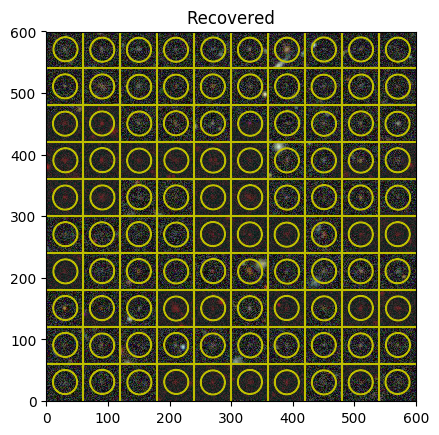

In [40]:
xslc,yslc= None,None #slice(2500,3200),slice(2300,3500) 
p= Panel(img_jpg,obitractor.bx[itrac],obitractor.by[itrac],
         xslc=xslc,yslc=yslc,
         hw=30,nrows=10)
fig,ax=plt.subplots()
p.plot(ax,title='Recovered')

### Can you visually see a difference between similar mag sources "Recoverd,Missed, and Real"?

In [41]:
for col in obitractor.get_columns():
    if len(obitractor.get(col).shape) > 1:
        print('removing col=',col)
        obitractor.delete_column(col)
obitractor.get_columns()

('removing col=', 'dchisq')
('removing col=', 'apflux_u')
('removing col=', 'apflux_g')
('removing col=', 'apflux_r')
('removing col=', 'apflux_i')
('removing col=', 'apflux_z')
('removing col=', 'apflux_y')
('removing col=', 'apflux_resid_u')
('removing col=', 'apflux_resid_g')
('removing col=', 'apflux_resid_r')
('removing col=', 'apflux_resid_i')
('removing col=', 'apflux_resid_z')
('removing col=', 'apflux_resid_y')
('removing col=', 'apflux_ivar_u')
('removing col=', 'apflux_ivar_g')
('removing col=', 'apflux_ivar_r')
('removing col=', 'apflux_ivar_i')
('removing col=', 'apflux_ivar_z')
('removing col=', 'apflux_ivar_y')


['release',
 'brickid',
 'brickname',
 'objid',
 'brick_primary',
 'type',
 'ra',
 'dec',
 'ra_ivar',
 'dec_ivar',
 'bx',
 'by',
 'ebv',
 'mjd_min',
 'mjd_max',
 'flux_u',
 'flux_g',
 'flux_r',
 'flux_i',
 'flux_z',
 'flux_y',
 'flux_ivar_u',
 'flux_ivar_g',
 'flux_ivar_r',
 'flux_ivar_i',
 'flux_ivar_z',
 'flux_ivar_y',
 'mw_transmission_u',
 'mw_transmission_g',
 'mw_transmission_r',
 'mw_transmission_i',
 'mw_transmission_z',
 'mw_transmission_y',
 'nobs_u',
 'nobs_g',
 'nobs_r',
 'nobs_i',
 'nobs_z',
 'nobs_y',
 'rchisq_u',
 'rchisq_g',
 'rchisq_r',
 'rchisq_i',
 'rchisq_z',
 'rchisq_y',
 'fracflux_u',
 'fracflux_g',
 'fracflux_r',
 'fracflux_i',
 'fracflux_z',
 'fracflux_y',
 'fracmasked_u',
 'fracmasked_g',
 'fracmasked_r',
 'fracmasked_i',
 'fracmasked_z',
 'fracmasked_y',
 'fracin_u',
 'fracin_g',
 'fracin_r',
 'fracin_i',
 'fracin_z',
 'fracin_y',
 'anymask_u',
 'anymask_g',
 'anymask_r',
 'anymask_i',
 'anymask_z',
 'anymask_y',
 'allmask_u',
 'allmask_g',
 'allmask_r',
 'all

(19, 30)

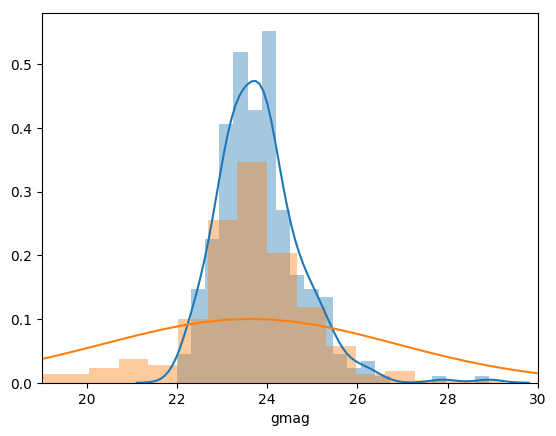

In [42]:
simcat_df= fits2pandas(simcat)
simcat_df['gmag']= F.simcat(simcat_df['gflux'])
sns.distplot(simcat_df['gmag'])

obitractor_df= fits2pandas(obitractor)
obitractor_df['gmag']= F.tractor(obitractor_df['flux_g'],
                                 obitractor_df['mw_transmission_z'])
sns.distplot(obitractor_df['gmag'])
      
plt.xlim(19,30)
#gmag= F.tractor(obitractor.flux_z[isObj],
#                obitractor.mw_transmission_z[isObj])
            

(43, 25)
(18, 25)
(102, 25)
(25, 25)
(42, 25)
(14, 25)
(20, 25)
(8, 25)


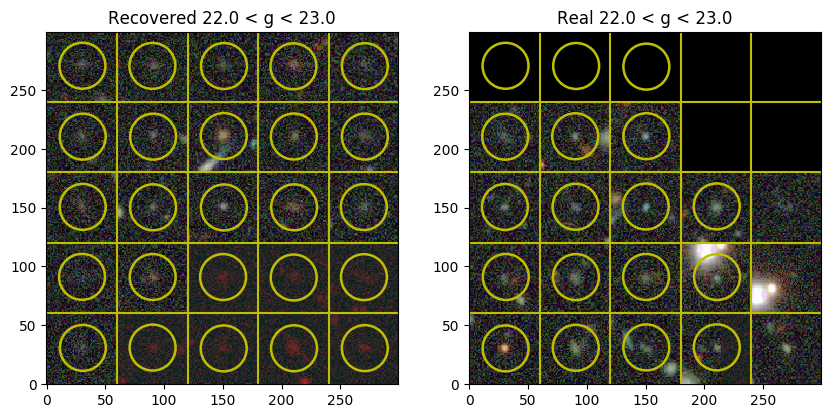

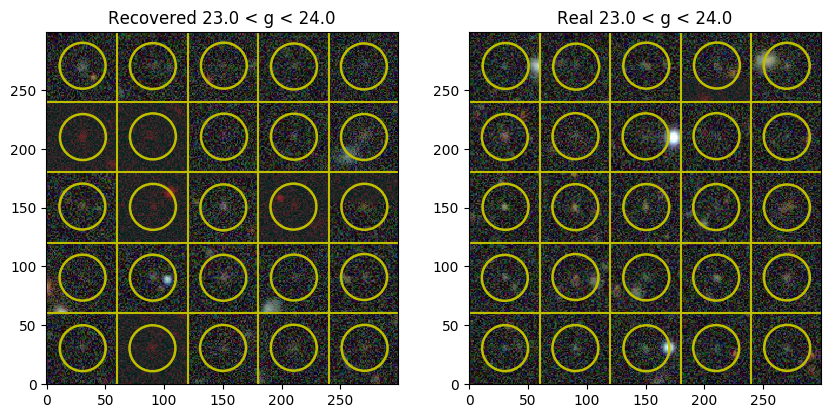

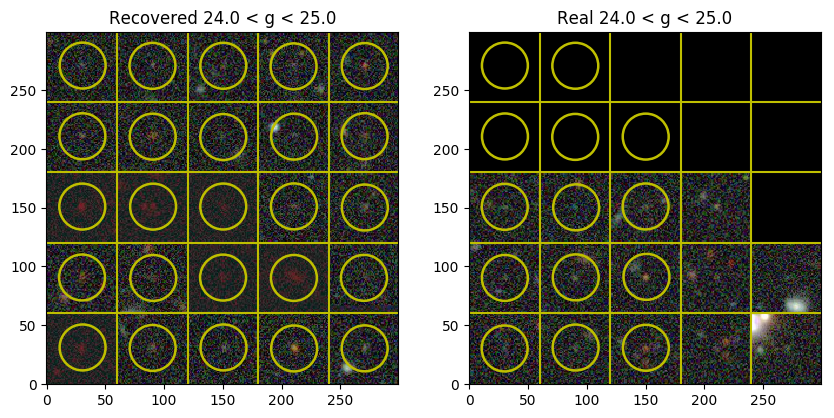

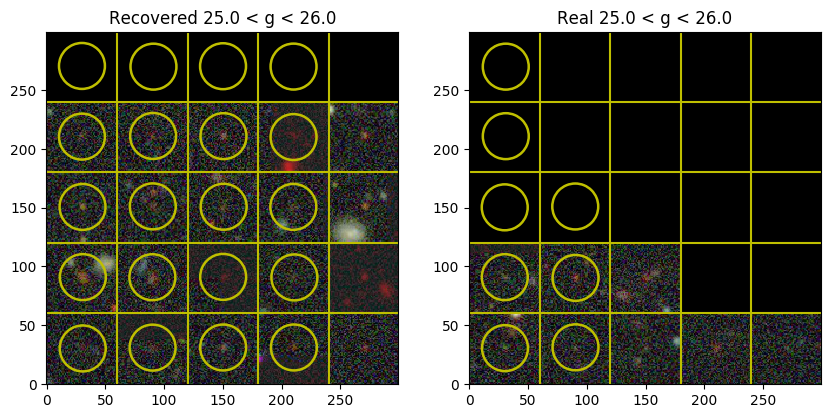

In [43]:
gmag_bins= np.linspace(22,26,num=5)
simcat_df['gmag_bins']= pd.cut(simcat_df['gmag'],bins=gmag_bins)
obitractor_df['gmag_bins']= pd.cut(obitractor_df['gmag'],bins=gmag_bins)

for categ in simcat_df['gmag_bins'].cat.categories:
    keep= ((simcat_df['gmag_bins'] == categ) &
           (indices2bool(isim,len(simcat_df))))
    if len(simcat_df[keep]) > 0:
        simPanel= Panel(img_jpg,
                        simcat_df.loc[keep,'x'].values,
                        simcat_df.loc[keep,'y'].values,
                        hw=30,nrows=5)
    keep= ((obitractor_df['gmag_bins'] == categ) &
           (indices2bool(not_itrac,len(obitractor_df))))
    if len(obitractor_df[keep]) > 0:
        obiPanel= Panel(img_jpg,
                        obitractor_df.loc[keep,'bx'].values,
                        obitractor_df.loc[keep,'by'].values,
                        hw=30,nrows=5)
    
    fig,ax=plt.subplots(1,2,figsize=(10,5))
    text= '%.1f < g < %.1f' % (categ.left,categ.right)
    simPanel.plot(ax[0],title='Recovered '+text)
    obiPanel.plot(ax[1],title='Real '+text)


## Each panel with brightest bottom right and dimmest top left

In [44]:
simcat_df.sort_values('gmag')['gmag'].head()

224    21.993821
32     22.268190
182    22.290115
222    22.303895
90     22.318836
Name: gmag, dtype: float64

(43, 25)
(18, 25)
(102, 25)
(25, 25)
(42, 25)
(14, 25)
(20, 25)
(8, 25)


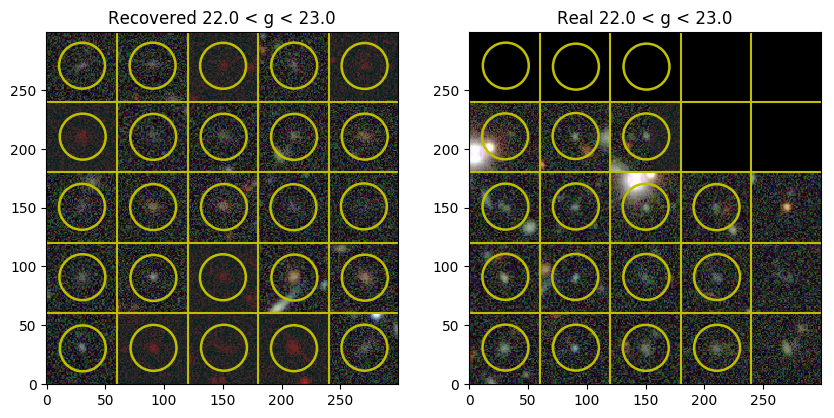

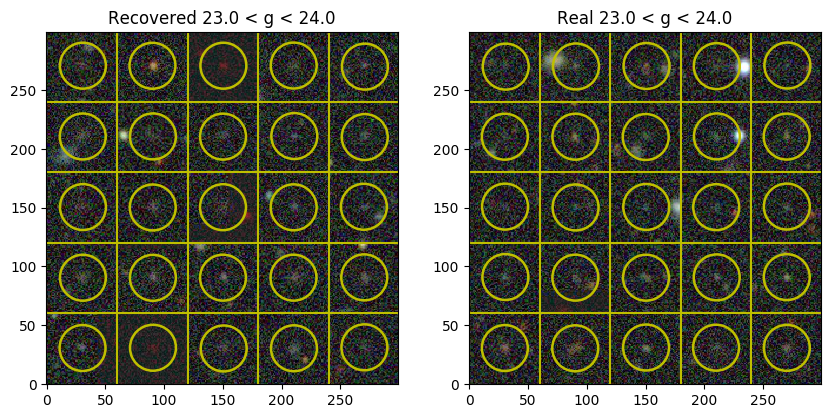

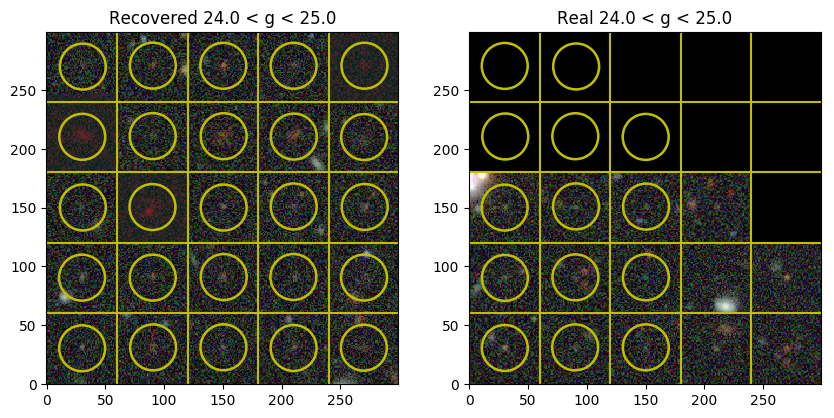

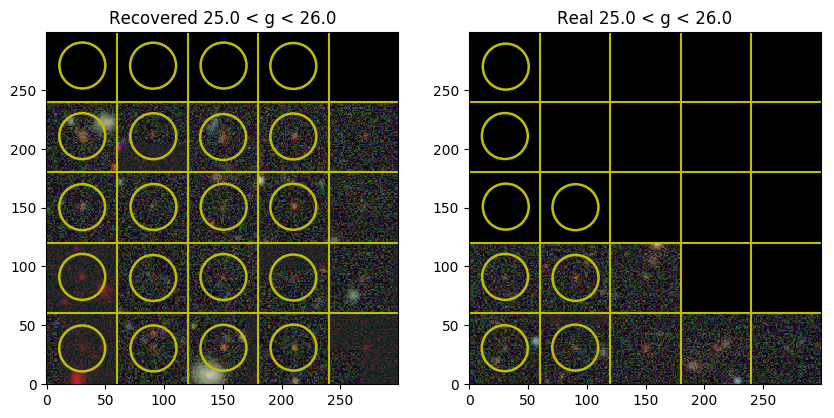

In [45]:
simcat_df_rec= simcat_df.iloc[isim].sort_values('gmag')
obitractor_df_real= obitractor_df.iloc[not_itrac].sort_values('gmag')
for categ in simcat_df['gmag_bins'].cat.categories:
    keep= simcat_df_rec['gmag_bins'] == categ
    if len(simcat_df_rec[keep]) > 0:
        simPanel= Panel(img_jpg,
                        simcat_df_rec.loc[keep,'x'].values,
                        simcat_df_rec.loc[keep,'y'].values,
                        hw=30,nrows=5)
    keep= obitractor_df_real['gmag_bins'] == categ
    if len(obitractor_df_real[keep]) > 0:
        obiPanel= Panel(img_jpg,
                        obitractor_df_real.loc[keep,'bx'].values,
                        obitractor_df_real.loc[keep,'by'].values,
                        hw=30,nrows=5)
    
    fig,ax=plt.subplots(1,2,figsize=(10,5))
    text= '%.1f < g < %.1f' % (categ.left,categ.right)
    simPanel.plot(ax[0],title='Recovered '+text)
    obiPanel.plot(ax[1],title='Real '+text)

In [46]:
def myshuffle(n):
    indices= np.arange(n)
    np.random.shuffle(indices)
    return indices

myshuffle(10)

array([8, 5, 0, 2, 1, 9, 7, 3, 6, 4])

### Are large rhalf less likely to be found? Correlated with Mag?

In this SMALL sample, don't Recover anything about rhalf > 2 arcsec

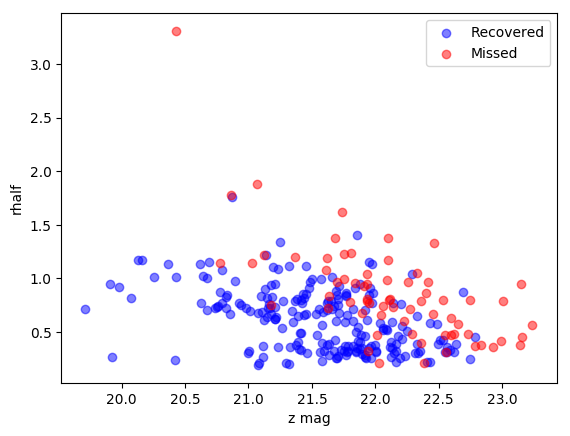

In [47]:
# Recovered vs. Missed
mag= F.simcat(simcat.zflux)
plt.scatter(mag[isim],simcat.rhalf[isim],c='b',label='Recovered',alpha=0.5)
plt.scatter(mag[not_isim],simcat.rhalf[not_isim],c='r',label='Missed',alpha=0.5)
plt.xlabel('z mag')
plt.ylabel('rhalf')
plt.legend()

In [48]:
print(set(obitractor_df['type']))
obitractor.get_columns()

set(['PSF ', 'EXP ', 'DEV ', 'COMP', 'REX '])


['release',
 'brickid',
 'brickname',
 'objid',
 'brick_primary',
 'type',
 'ra',
 'dec',
 'ra_ivar',
 'dec_ivar',
 'bx',
 'by',
 'ebv',
 'mjd_min',
 'mjd_max',
 'flux_u',
 'flux_g',
 'flux_r',
 'flux_i',
 'flux_z',
 'flux_y',
 'flux_ivar_u',
 'flux_ivar_g',
 'flux_ivar_r',
 'flux_ivar_i',
 'flux_ivar_z',
 'flux_ivar_y',
 'mw_transmission_u',
 'mw_transmission_g',
 'mw_transmission_r',
 'mw_transmission_i',
 'mw_transmission_z',
 'mw_transmission_y',
 'nobs_u',
 'nobs_g',
 'nobs_r',
 'nobs_i',
 'nobs_z',
 'nobs_y',
 'rchisq_u',
 'rchisq_g',
 'rchisq_r',
 'rchisq_i',
 'rchisq_z',
 'rchisq_y',
 'fracflux_u',
 'fracflux_g',
 'fracflux_r',
 'fracflux_i',
 'fracflux_z',
 'fracflux_y',
 'fracmasked_u',
 'fracmasked_g',
 'fracmasked_r',
 'fracmasked_i',
 'fracmasked_z',
 'fracmasked_y',
 'fracin_u',
 'fracin_g',
 'fracin_r',
 'fracin_i',
 'fracin_z',
 'fracin_y',
 'anymask_u',
 'anymask_g',
 'anymask_r',
 'anymask_i',
 'anymask_z',
 'anymask_y',
 'allmask_u',
 'allmask_g',
 'allmask_r',
 'all

In [51]:
isGal= obitractor_df['type'] == 'PSF '
obitractor_df.loc[isGal,['type','psfsize_g','psfsize_r','psfsize_z','shapeexp_r','shapedev_r']].head()


,type,psfsize_g,psfsize_r,psfsize_z,shapeexp_r,shapedev_r
8,PSF,1.217095,1.041571,1.166601,0.0,0.0
15,PSF,1.217095,1.041571,1.063296,0.0,0.0
18,PSF,1.217095,1.041571,1.091158,0.0,0.0
24,PSF,1.217095,1.041571,1.105378,0.0,0.0
28,PSF,1.217095,1.041571,1.168029,0.0,0.0


In [52]:
# Recovered vs. Real
isGal= obitractor_df['type'] != 'PSF '
obitractor_df.loc[isGal,['type','psfsize_g','psfsize_r','psfsize_z','shapeexp_r','shapedev_r']].head()


,type,psfsize_g,psfsize_r,psfsize_z,shapeexp_r,shapedev_r
0,REX,1.238828,1.038830,1.152590,0.926860,0.0
1,REX,1.217095,1.041571,1.244965,0.261353,0.0
2,REX,1.217095,1.041571,1.155406,0.701151,0.0
3,REX,1.217095,1.041571,1.154364,0.529196,0.0
4,REX,1.217095,1.041571,1.156058,0.642927,0.0


In [53]:
obitractor_df.loc[:,['shapeexp_r','shapedev_r']].shape #max(axis=1).shape

(321, 2)

In [54]:
len(simcat[isim]),len(obitractor[itrac]),len(simcat_df.iloc[isim]),len(obitractor_df.iloc[isim])

(214, 214, 214, 214)

In [64]:
np.max([obitractor.shapeexp_r,obitractor.shapeexp_r],axis=0).shape

(321,)

In [66]:
def get_source_sizes(tractor):
    rhalf= np.zeros(len(tractor))-1
    isGal= np.char.strip(tractor.get('type')) != 'PSF'
    vals= [tractor[isGal].get(col).max()
           for col in ['shapeexp_r','shapedev_r']]
    rhalf[isGal]= np.max([obitractor[isGal].shapeexp_r,
                          obitractor[isGal].shapedev_r],axis=0)
    rhalf[~isGal]= np.max([obitractor[~isGal].psfsize_g,
                           obitractor[~isGal].psfsize_r,
                           obitractor[~isGal].psfsize_z],axis=0)
    return rhalf

obitractor.set('rhalf',get_source_sizes(obitractor))

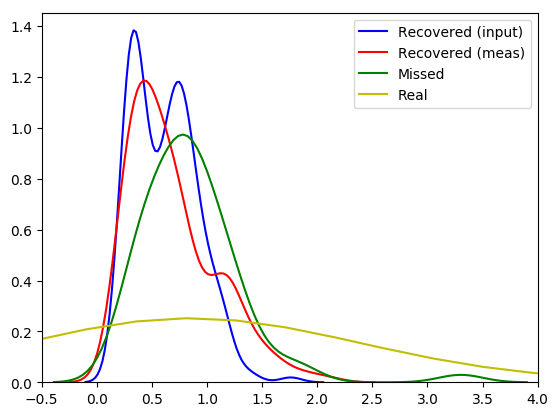

In [70]:
sns.distplot(simcat[isim].rhalf,hist=False,
             color='b',label='Recovered (input)')
sns.distplot(obitractor[itrac].rhalf,hist=False,
             color='r',label='Recovered (meas)')
sns.distplot(simcat[not_isim].rhalf,hist=False,
             color='g',label='Missed')
sns.distplot(obitractor[not_itrac].rhalf,hist=False,
             color='y',label='Real')
#print(simcat_df.iloc[isim]['rhalf'].min())
#print(obitractor_df.iloc[itrac]['rhalf'].min())
plt.xlim(-0.5,4)
plt.legend()

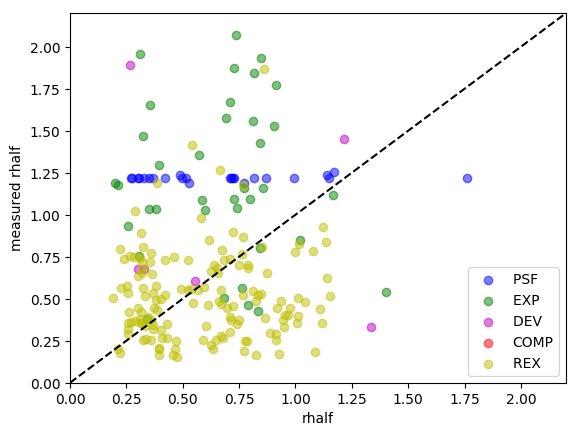

In [134]:
sim_rec= simcat[isim]
obi_rec= obitractor[isim]
for typ,c in zip(set(obi_rec.get('type')),
                 ['b','g','m','r','y']):
    keep= obi_rec.get('type') == typ
    plt.scatter(sim_rec[keep].rhalf,
                obi_rec[keep].rhalf,
                c=c,label=typ,alpha=0.5)
lim=(0,2.2)
plt.xlim(lim)
plt.ylim(lim)
plt.plot(lim,lim,'k--')
plt.xlabel('rhalf')
plt.ylabel('measured rhalf')
plt.legend()

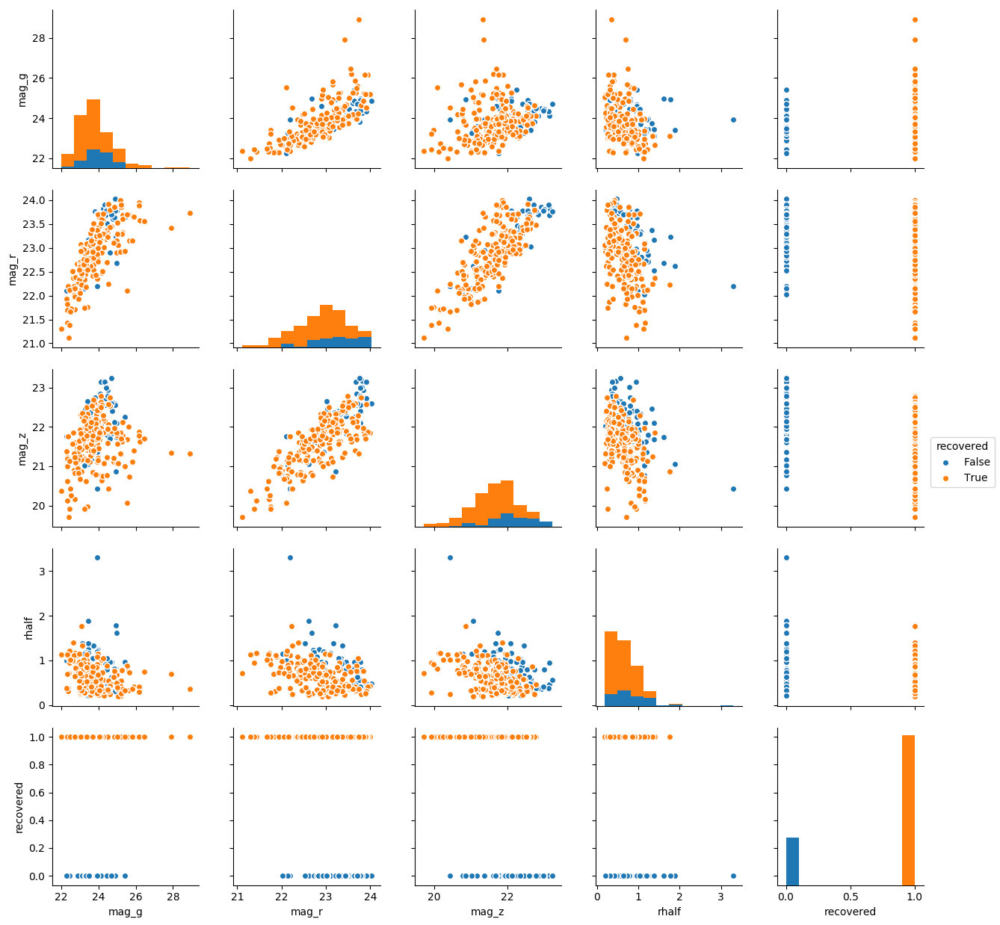

In [135]:
simcat_df= fits2pandas(simcat)
for b in ['g','r','z']:
    simcat_df['mag_'+b]= F.simcat(simcat.get(b+'flux')).data

attrs= ['mag_g','mag_r','mag_z','rhalf','recovered']
simcat_df['recovered']= indices2bool(isim,len(simcat_df))
g = sns.pairplot(simcat_df[attrs], hue="recovered")

### Add redshift info to simcat, what does n(z) look like for...

* recovered/missed
* recovered but in/out ELG cut

In [96]:
id_z= pd.read_csv(os.path.join(DATA_DIR,
            '1741p242','rs0','redshifts_1741p242_rs0.txt'),
            sep=' ',header=None,names=['id','redshift'])
id_z.head()

,id,redshift
0,315,0.867227
1,776,0.857452
2,1173,1.017691
3,1711,0.942499
4,2448,1.020890


In [97]:
ids,z= np.loadtxt(os.path.join(DATA_DIR,
                 '1741p242','rs0','redshifts_1741p242_rs0.txt'),
                 dtype=str,unpack=True)

simcat_z= pd.merge(simcat_df,id_z,how='inner',on='id')
len(simcat_df),len(simcat_z)

(282, 282)

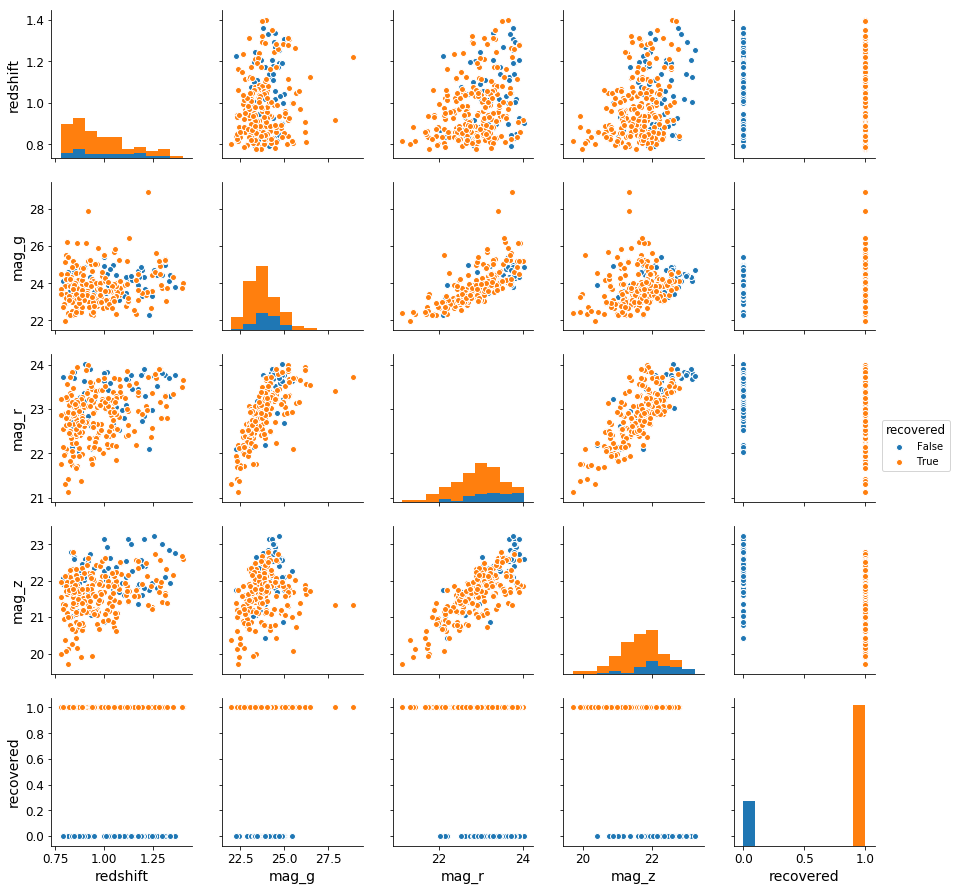

In [98]:
attrs= ['redshift','mag_g','mag_r','mag_z','recovered']
g = sns.pairplot(simcat_z[attrs], hue="recovered")

## ALL simulated sources have sersicn = 1
## Does the sersic n of Recovered differ from Real?

/home/kaylan/env_galsim/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,recovered,real
EXP,0.939252,0.654206
PSF,0.051402,0.233645
DEV,0.009346,0.093458


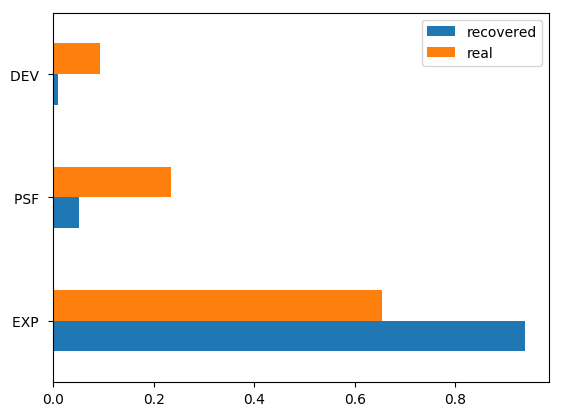

In [137]:
n_rec= len(obitractor_df.iloc[itrac])
n_real= len(obitractor_df.iloc[not_itrac])

rex_to_exp=True
if rex_to_exp:
    obitractor_df['type'][obitractor_df['type'] == 'REX '] = 'EXP '
df=obitractor_df['type'].iloc[itrac].value_counts().to_frame() / n_rec
df.rename(columns={'type':'recovered'},inplace=True)
df= pd.merge(df,obitractor_df['type'].iloc[not_itrac].value_counts().to_frame(),
             left_index=True,right_index=True)
df= df.rename(columns={'type':'real'})
df['real']= df['real']/n_real
display(df.head())
df.plot.barh()

### Draw targest selection color mag box, and color code by recovered, missed

In [99]:
from obiwan.priors import TSBox

(-0.3, 2.2)

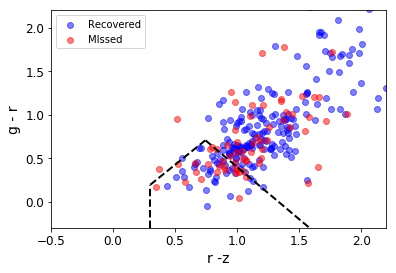

In [100]:
# g-r vs. r-z
ts= TSBox(src='ELG')

fig,ax=plt.subplots()
ts.add_ts_box(ax, xlim=[-0.5,2.2],ylim=[-0.3,2.2])
rz= simcat_df['mag_r'] - simcat_df['mag_z']
gr= simcat_df['mag_g'] - simcat_df['mag_r']
ax.scatter(rz[isim],gr[isim],c='b',label='Recovered',alpha=0.5)
ax.scatter(rz[not_isim],gr[not_isim],c='r',label='MIssed',alpha=0.5)
ax.set_xlabel('r -z')
ax.set_ylabel('g - r')
ax.legend()
ax.set_xlim([-0.5,2.2])
ax.set_ylim([-0.3,2.2])

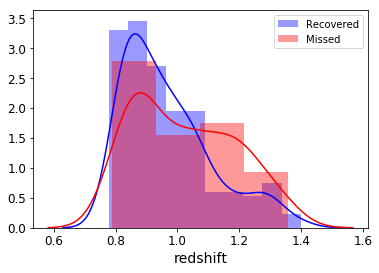

In [101]:
sns.distplot(simcat_z['redshift'][isim],color='b',label='Recovered')
sns.distplot(simcat_z['redshift'][not_isim],color='r',label='Missed')
plt.legend()

(-0.3, 2.2)

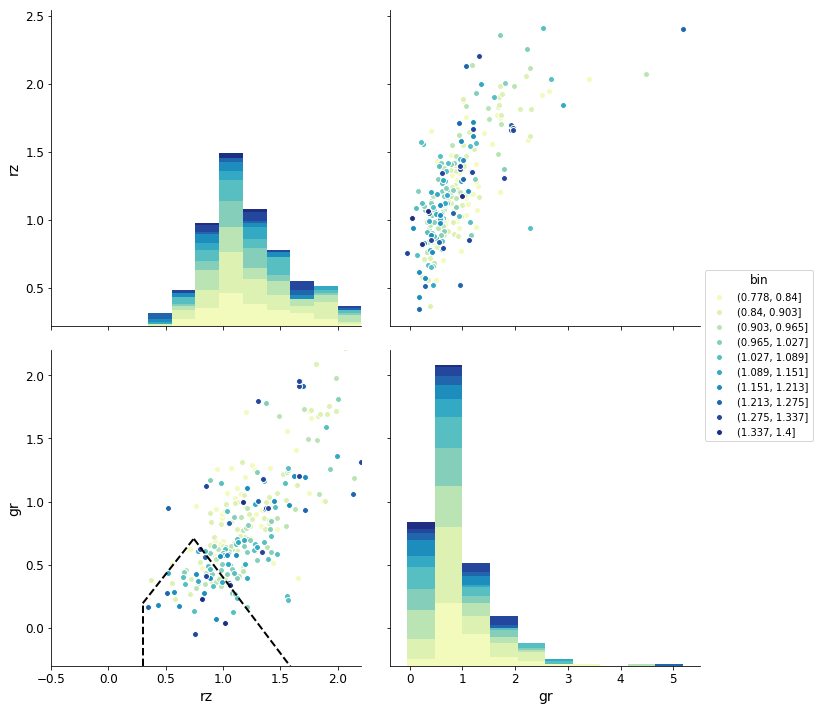

In [102]:
simcat_z['rz']= simcat_z['mag_r'] - simcat_z['mag_z']
simcat_z['gr']= simcat_z['mag_g'] - simcat_z['mag_r']
#zmin,zmax= 
simcat_z["bin"] = pd.cut(simcat_z['redshift'],bins=10)

attrs= ['rz','gr','bin']
g = sns.pairplot(simcat_z[attrs], hue="bin",
                 hue_order=simcat_z.bin.cat.categories,
                 palette="YlGnBu",size=5)
        
ts= TSBox(src='ELG')
ts.add_ts_box(g.axes[1,0], xlim=[-0.5,2.2],ylim=[-0.3,2.2])
g.axes[1,0].set_xlim(-0.5,2.2)
g.axes[1,0].set_ylim(-0.3,2.2)

## A good CCD

In [4]:
ccds= fits_table(os.path.join(DATA_DIR,
                 '1741p242','dr5/legacysurvey-1741p242-ccds.fits'))
df=fits2pandas(ccds)
df['seeing']=df['fwhm']*0.262
(df.loc[np.argsort(df['ccdnmatch'])[::-1],
       ['expnum','ccdname','seeing','ccdnmatch','image_filename']]
   .to_csv('df.csv'))
!head df.csv

,expnum,ccdname,seeing,ccdnmatch,image_filename
12,511967,S17,0.889886796474,47,decam/DECam_CP/CP20160107/c4d_160116_084245_oki_z_v1.fits.fz     
14,432018,S17,1.10720980167,47,decam/DECam_CP/CP20150407/c4d_150412_031122_ooi_g_v1.fits.fz     
13,432019,S17,0.90438747406,44,decam/DECam_CP/CP20150407/c4d_150412_031257_ooi_r_v1.fits.fz     
18,425662,S16,1.23162901402,43,decam/DECam_CP/CP20150326/c4d_150329_031648_ooi_z_v1.fits.fz     
1,432018,S5 ,1.08038723469,43,decam/DECam_CP/CP20150407/c4d_150412_031122_ooi_g_v1.fits.fz     
9,630980,S16,0.835699975491,43,decam/DECam_CP/CP20170316/c4d_170317_044025_oki_z_v1.fits.fz     
25,630980,S20,0.839677155018,43,decam/DECam_CP/CP20170316/c4d_170317_044025_oki_z_v1.fits.fz     
17,432018,S11,1.0755007267,42,decam/DECam_CP/CP20150407/c4d_150412_031122_ooi_g_v1.fits.fz     
15,511967,S11,0.874530553818,41,decam/DECam_CP/CP20160107/c4d_160116_084245_oki_z_v1.fits.fz     
